In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/test-image1/images1.jpg
/kaggle/input/video1-test/sample_video.mp4
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/normal38.txt
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/normal4.txt
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/pothole890.txt
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/pothole910.txt
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/normal39.txt
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/pothole941.txt
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/pothole885.txt
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/pothole934.txt
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/pothole897.txt
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/normal42.txt
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/normal17.txt
/kaggle/input/pothole-dataset-detect/new_dataset/labels/val/pothole887.txt
/kaggle/input/pothole-dataset-

In [2]:
!pip install opencv-python

In [3]:
import cv2

In [4]:
!wget https://github.com/Dao-AILab/flash-attention/releases/download/v2.7.3/flash_attn-2.7.3+cu11torch2.2cxx11abiFALSE-cp311-cp311-linux_x86_64.whl

--2026-01-17 16:50:16--  https://github.com/Dao-AILab/flash-attention/releases/download/v2.7.3/flash_attn-2.7.3+cu11torch2.2cxx11abiFALSE-cp311-cp311-linux_x86_64.whl
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/494232964/b7fb7022-424c-4ac2-b46b-a41f386edaa5?sp=r&sv=2018-11-09&sr=b&spr=https&se=2026-01-17T17%3A42%3A53Z&rscd=attachment%3B+filename%3Dflash_attn-2.7.3%2Bcu11torch2.2cxx11abiFALSE-cp311-cp311-linux_x86_64.whl&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2026-01-17T16%3A41%3A58Z&ske=2026-01-17T17%3A42%3A53Z&sks=b&skv=2018-11-09&sig=%2FepUlUOsqyyNUxqPk4uoNYysOtGPPLpH4DLj08DADWk%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNv

In [5]:
!pip install flash_attn-2.7.3+cu11torch2.2cxx11abiFALSE-cp311-cp311-linux_x86_64.whl

Processing ./flash_attn-2.7.3+cu11torch2.2cxx11abiFALSE-cp311-cp311-linux_x86_64.whl
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 34.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 14.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.9 MB/s eta 0:00:000:00:010:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 97.0 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found exis

In [6]:
!git clone https://github.com/sunsmarterjie/yolov12.git 

Cloning into 'yolov12'...
remote: Enumerating objects: 1163, done.
remote: Counting objects: 100% (581/581), done.
remote: Compressing objects: 100% (136/136), done.
remote: Total 1163 (delta 496), reused 445 (delta 445), pack-reused 582 (from 2)
Receiving objects: 100% (1163/1163), 1.92 MiB | 10.11 MiB/s, done.
Resolving deltas: 100% (517/517), done.


In [7]:
!pip install -r /kaggle/working/yolov12/requirements.txt

Processing ./flash_attn-2.7.3+cu11torch2.2cxx11abiFALSE-cp311-cp311-linux_x86_64.whl (from -r /kaggle/working/yolov12/requirements.txt (line 3))
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.8/50.8 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.5/41.5 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 4.0 MB/s eta 0:00:00
flash-attn is already installed with the same version as the provided wheel. Use --force-reinstall to force an installation of the wheel.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.6/755.6 MB 1.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 78.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 84.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.6/289.6 kB 21.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 86.0 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.

In [8]:
%cd /kaggle/working/yolov12

/kaggle/working/yolov12


In [9]:
!pip install -e .

Obtaining file:///kaggle/working/yolov12
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.3.63-0.editable-py3-none-any.whl size=20241 sha256=c273f16164828163d3e8981301cca71216e4bfa3f520ed95b17db78d84bf7479
  Stored in directory: /tmp/pip-ephem-wheel-cache-hutbzlo1/wheels/0e/68/81/3a3a6338ac8f04c0d641309981ec624171fa9d95e7d27573a6
Successfully built ultralytics


In [10]:
yaml_content = """
path: /kaggle/input/pothole-dataset-detect/new_dataset
train: images/train
val: images/val

nc: 1
names: ['pothole']
"""

with open('/kaggle/working/data.yaml', 'w') as f:
    f.write(yaml_content)


In [11]:
!cat /kaggle/working/data.yaml


path: /kaggle/input/pothole-dataset-detect/new_dataset
train: images/train
val: images/val

nc: 1
names: ['pothole']


In [12]:
from ultralytics import YOLO

model = YOLO('yolov12n.yaml')

# Train the model
results = model.train(
  data='/kaggle/working/data.yaml',
  epochs=70,
  batch=64,
  imgsz=640,
  scale=0.5,
  mosaic=1.0,
  mixup=0.0,
  copy_paste=0.1,
  device=0  # ✅ Only one GPU is available in Kaggle
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/yolov12/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
New https://pypi.org/project/ultralytics/8.4.5 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.2.2+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov12n.yaml, data=/kaggle/working/data.yaml, epochs=70, time=None, patience=100, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp

100%|██████████| 755k/755k [00:00<00:00, 16.1MB/s]
E0000 00:00:1768668887.066778      37 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1768668887.121347      37 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      2368  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2, 1, 2]          
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1      9344  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2, 1, 4]          
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  2    174720  ultralytics.nn.modules.block.A2C2f           [128, 128, 2, True, 4]        
  7                  -1  1    295424  ultralytics

100%|██████████| 5.26M/5.26M [00:00<00:00, 63.5MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/pothole-dataset-detect/new_dataset/labels/train... 1074 images, 218 backgrounds, 0 corrupt: 100%|██████████| 1074/1074 [00:02<00:00, 521.23it/s]

train: WARNING ⚠️ Cache directory /kaggle/input/pothole-dataset-detect/new_dataset/labels is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/kaggle/working/yolov12/ultralytics/data/augment.py:1853: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
val: Scanning /kaggle/input/pothole-dataset-detect/new_dataset/labels/val... 99 images, 37 backgrounds, 0 corrupt: 100%|██████████| 99/99 [00:00<00:00, 375.64it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/pothole-dataset-detect/new_dataset/labels is not writeable, cache not saved.


Plotting labels to /kaggle/working/yolov12/runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 121 weight(decay=0.0), 128 weight(decay=0.0005), 127 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /kaggle/working/yolov12/runs/detect/train
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/70        13G       3.54      3.715      4.185        282        640: 100%|██████████| 17/17 [00:18<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]

                   all         99        326    0.00256      0.233    0.00239   0.000916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/70      13.3G      3.496      3.552      4.082        257        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         99        326    0.00263      0.239     0.0026   0.000887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/70      13.1G      3.345      3.407      3.858        338        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]

                   all         99        326    0.00283      0.258    0.00296   0.000953



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/70      13.4G      3.009      3.287      3.539        237        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]

                   all         99        326    0.00242      0.221     0.0025   0.000719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/70      13.1G      2.732      3.171      3.212        328        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         99        326     0.0031      0.282    0.00491    0.00163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/70      13.1G      2.594       3.06       2.98        275        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

                   all         99        326     0.0304     0.0368    0.00819    0.00227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/70      13.1G      2.534      2.957      2.844        270        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

                   all         99        326     0.0304     0.0368    0.00696    0.00198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/70        13G      2.464      2.893      2.747        278        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

                   all         99        326     0.0317     0.0583     0.0111    0.00303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/70      13.1G      2.397      2.841      2.671        237        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all         99        326     0.0486     0.0583     0.0162    0.00325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/70      12.9G      2.356      2.786       2.62        245        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

                   all         99        326      0.128      0.107     0.0305    0.00784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/70        13G      2.285      2.709      2.543        274        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

                   all         99        326     0.0954       0.13     0.0453     0.0152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/70      12.9G      2.282      2.664      2.507        234        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

                   all         99        326     0.0842      0.113     0.0301    0.00896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/70      12.9G      2.247        2.6      2.473        269        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

                   all         99        326      0.109      0.113     0.0577     0.0135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/70      13.2G      2.207      2.555      2.441        278        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         99        326      0.217      0.135     0.0792     0.0251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/70      13.1G      2.178      2.536      2.412        295        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

                   all         99        326      0.203      0.153     0.0981     0.0311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/70      13.1G      2.172      2.511      2.379        230        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all         99        326      0.139      0.113     0.0667     0.0212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/70      13.5G      2.171      2.467      2.372        314        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         99        326      0.199      0.104     0.0723     0.0261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/70        13G      2.126      2.427      2.343        290        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

                   all         99        326       0.33      0.212      0.171     0.0557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/70      13.1G      2.127       2.44      2.338        253        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         99        326        0.1      0.113     0.0341     0.0108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/70      13.1G      2.111      2.395      2.312        266        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         99        326      0.197      0.166      0.108     0.0372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/70      13.3G      2.105        2.4      2.313        326        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

                   all         99        326      0.205      0.181      0.113     0.0398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/70      13.6G      2.083      2.353      2.282        290        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

                   all         99        326      0.278      0.092     0.0779      0.027



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/70      13.3G      2.069       2.32      2.245        285        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         99        326      0.263      0.153       0.12     0.0428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/70      12.8G      2.049      2.348      2.245        224        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

                   all         99        326      0.248      0.187       0.13      0.042



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/70      13.1G      2.051      2.319      2.255        271        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         99        326      0.342      0.262      0.215     0.0744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/70      13.3G      2.049       2.32      2.253        246        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         99        326      0.327      0.281      0.221     0.0772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/70      13.1G      2.019      2.265      2.212        318        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

                   all         99        326      0.188       0.23      0.113     0.0419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/70        13G      2.023      2.265      2.205        343        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

                   all         99        326      0.343      0.255      0.247     0.0844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/70      13.1G       2.01      2.238      2.199        335        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

                   all         99        326      0.231      0.199      0.141     0.0496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/70      13.4G      2.012      2.261      2.193        248        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

                   all         99        326      0.244      0.212      0.155     0.0604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/70        13G      2.012      2.215      2.182        230        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

                   all         99        326      0.228      0.187      0.127     0.0393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/70      12.9G      1.998      2.213       2.18        303        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         99        326      0.306      0.207      0.165     0.0559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/70      12.9G      2.015      2.197      2.184        285        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

                   all         99        326      0.367      0.282      0.249     0.0834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/70      12.9G      1.989      2.177      2.144        259        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         99        326      0.352      0.224      0.193     0.0714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/70      13.2G      1.963       2.19      2.135        300        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         99        326      0.404      0.291      0.304      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/70      13.1G      1.964      2.161      2.135        319        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         99        326      0.443      0.285      0.301      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/70      13.1G      1.977       2.17      2.147        314        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

                   all         99        326      0.344       0.27      0.234      0.079



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/70      13.1G      1.972      2.139      2.131        265        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         99        326      0.297       0.27      0.218     0.0802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/70      13.3G      1.976       2.17      2.132        356        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

                   all         99        326       0.41      0.301      0.302      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/70      13.1G      1.966      2.146      2.125        302        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

                   all         99        326      0.283      0.239      0.162     0.0574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/70      13.4G      1.944      2.124      2.115        255        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         99        326      0.381      0.304      0.283      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/70      13.6G      1.925      2.117      2.101        297        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         99        326      0.415      0.322      0.318      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/70      13.1G      1.925        2.1      2.101        233        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

                   all         99        326      0.379      0.301      0.278     0.0965



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/70      13.2G      1.933       2.07      2.102        243        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         99        326      0.406      0.289      0.279     0.0993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/70      13.1G      1.929      2.059      2.095        307        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         99        326      0.529      0.313       0.33      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/70      13.2G       1.92       2.07      2.091        306        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         99        326      0.464      0.307      0.319      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/70      13.2G      1.895      2.043      2.072        264        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         99        326      0.392      0.313      0.273      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/70      12.9G      1.891      2.036       2.08        269        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         99        326      0.544      0.294      0.328      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/70      13.5G      1.918      2.036      2.081        283        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         99        326      0.436       0.33      0.328      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/70      13.5G      1.921      2.046      2.084        312        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         99        326      0.494      0.324      0.337      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/70      13.1G      1.908      2.068      2.089        307        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         99        326       0.45      0.279      0.313      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/70      12.9G      1.892      2.035      2.075        269        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         99        326      0.441      0.282      0.299       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/70      13.1G      1.893      2.039      2.055        246        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         99        326      0.511      0.322      0.336      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/70        13G       1.89      1.993      2.057        341        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         99        326      0.464      0.344      0.355      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/70      13.1G      1.864      1.958      2.039        246        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         99        326      0.446      0.328       0.34      0.125


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/kaggle/working/yolov12/ultralytics/data/augment.py:1853: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/70        13G      1.966      2.054      2.179        123        640: 100%|██████████| 17/17 [00:20<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         99        326      0.393      0.285      0.265     0.0935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/70      13.1G      1.933      1.994      2.172        146        640: 100%|██████████| 17/17 [00:17<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         99        326      0.428      0.319      0.307      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/70        13G      1.939      1.952      2.166        161        640: 100%|██████████| 17/17 [00:17<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         99        326      0.413       0.31      0.298      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/70        13G      1.919      1.957      2.155        105        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         99        326      0.532      0.317      0.346      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/70        13G      1.911      1.919      2.147        184        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         99        326      0.465      0.353       0.37       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/70        13G      1.906      1.914      2.132        138        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         99        326      0.485       0.35      0.357      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/70      12.9G      1.909      1.902      2.136        167        640: 100%|██████████| 17/17 [00:17<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

                   all         99        326      0.498      0.365      0.371       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/70        13G      1.911      1.888       2.13        112        640: 100%|██████████| 17/17 [00:17<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         99        326      0.495      0.343      0.357      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/70        13G      1.898      1.901      2.133        130        640: 100%|██████████| 17/17 [00:17<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

                   all         99        326      0.484      0.347      0.376      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/70        13G      1.899      1.894      2.123        139        640: 100%|██████████| 17/17 [00:17<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         99        326      0.465      0.342      0.361      0.144



70 epochs completed in 0.390 hours.
Optimizer stripped from /kaggle/working/yolov12/runs/detect/train/weights/last.pt, 5.4MB
Optimizer stripped from /kaggle/working/yolov12/runs/detect/train/weights/best.pt, 5.4MB

Validating /kaggle/working/yolov12/runs/detect/train/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.2.2+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv12n summary (fused): 376 layers, 2,508,539 parameters, 0 gradients, 5.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


                   all         99        326      0.488      0.347      0.376      0.147


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 3.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/yolov12/runs/detect/train


In [13]:
from ultralytics import YOLO

model = YOLO("/kaggle/working/yolov12/runs/detect/train/weights/best.pt")


In [14]:
import os

image_path = "/kaggle/input/pothole-dataset-detect/new_dataset/images/train/pothole206.jpg"

print("Image path:", image_path)
print("Exists:", os.path.exists(image_path))


Image path: /kaggle/input/pothole-dataset-detect/new_dataset/images/train/pothole206.jpg
Exists: True



image 1/1 /kaggle/input/pothole-dataset-detect/new_dataset/images/train/pothole206.jpg: 640x640 1 pothole, 17.7ms
Speed: 1.8ms preprocess, 17.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


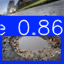

In [15]:
# Use full path to the test image
image_path = "/kaggle/input/pothole-dataset-detect/new_dataset/images/train/pothole206.jpg"

# Run inference
results = model(image_path)

# Show detection results
results[0].show()


image 1/1 /kaggle/input/pothole-dataset-detect/new_dataset/images/train/pothole836.jpg: 640x640 7 potholes, 19.1ms
Speed: 1.7ms preprocess, 19.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


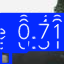

In [16]:
# Use full path to the test image
image_path = "/kaggle/input/pothole-dataset-detect/new_dataset/images/train/pothole836.jpg"

# Run inference
results = model(image_path)

# Show detection results
results[0].show()


image 1/1 /kaggle/input/pothole-dataset-detect/new_dataset/images/train/pothole836.jpg: 640x640 7 potholes, 19.9ms
Speed: 1.9ms preprocess, 19.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


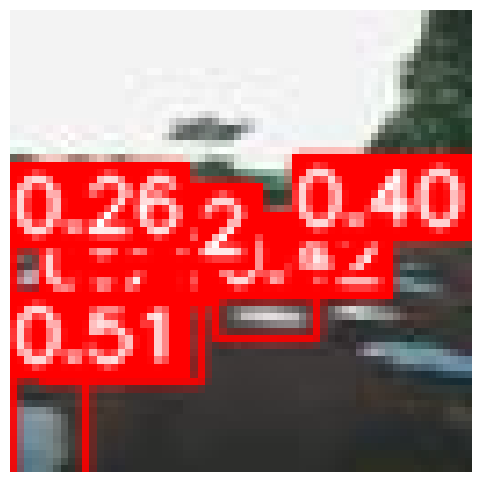

In [17]:
from ultralytics.utils.plotting import Annotator
import matplotlib.pyplot as plt

# Load image and results
img_path = "/kaggle/input/pothole-dataset-detect/new_dataset/images/train/pothole836.jpg"
results = model(img_path)
boxes = results[0].boxes
img = results[0].orig_img.copy()

# Create annotator with integer line width and smaller font
annotator = Annotator(img, line_width=1, font_size=0.4)  # line_width must be int

# Annotate only confidence
for box in boxes:
    b = box.xyxy.squeeze().cpu().numpy().astype(int)
    conf = float(box.conf.cpu().numpy().item())  # Fix warning by extracting scalar
    label = f"{conf:.2f}"
    annotator.box_label(b, label, color=(255, 0, 0))

# Show result
plt.figure(figsize=(6, 6))
plt.imshow(annotator.result())
plt.axis('off')
plt.show()


In [18]:
import os

video_path = "/kaggle/input/video1-test/sample_video.mp4"
print("Video found:", os.path.exists(video_path))

Video found: True


In [19]:
from IPython.display import Video

Video(video_path, embed=True)


In [20]:
from ultralytics import YOLO

model = YOLO("/kaggle/working/yolov12/runs/detect/train/weights/best.pt")  # adjust path if needed


In [21]:
results = model.predict(
    source="/kaggle/input/video1-test/sample_video.mp4",
    conf=0.05,        
    iou=0.45,         
    save=True,
    save_txt=True,
    verbose=True
)




WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/375) /kaggle/input/video1-test/sample_video.mp4: 384x640 1 pothole, 85.8ms
video 1/1 (frame 2/375) /kaggle/input/video1-test/sample_video.mp4: 384x640 (no detections), 18.3ms
video 1/1 (frame 3/375) /kaggle/input/video1-test/sample_video.mp4: 384x640 (no detections), 19.0ms
video 1/1 (frame 4/375) /kaggle/input/video1-test/sample_video.mp4: 384x640 1 pothole, 18.7ms
video 1/1 (frame 5/375) /kaggle/input/video1-test/sample_video.mp4: 

In [22]:
import os

path = "/kaggle/working/yolov12/runs/detect/predict"
for file in os.listdir(path):
    print(file)

sample_video.avi
labels


In [23]:
!ffmpeg -y -i /kaggle/working/yolov12/runs/detect/predict/sample_video.avi \
  -vcodec libx264 -acodec aac /kaggle/working/pothole_video_fixed.mp4


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [26]:
from IPython.display import Video

Video("/kaggle/working/pothole_video_fixed.mp4", embed=True)




image 1/1 /kaggle/input/test-image1/images1.jpg: 640x640 1 pothole, 23.3ms
Speed: 2.9ms preprocess, 23.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/yolov12/runs/detect/predict
182 labels saved to /kaggle/working/yolov12/runs/detect/predict/labels


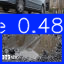

In [27]:
# Use full path to the test image
image_path = "/kaggle/input/test-image1/images1.jpg"

# Run inference
results = model(image_path)

# Show detection results
results[0].show()

In [ ]:
!ls /kaggle/working/yolov12/runs/detect/train/weights